In [28]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm

In [29]:
fce = pd.read_csv('../datasets/farm_cat_eco.csv') #fce = farm_cat_eco

### ydata

In [90]:
from ydata_profiling import ProfileReport
ProfileReport(fce)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 26/26 [00:00<00:00, 631.76it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## DF inspection

In [ ]:
fce.head()

In [ ]:
fce.info

In [30]:
fce['cats_nonforest'] = fce['cats_occurrence_total'] - fce['cats_forest']
fce['cats_nonforest']

0      120.0
1       58.0
2       32.0
3        7.0
4       14.0
       ...  
174     62.0
175    136.0
176     73.0
177     67.0
178     51.0
Name: cats_nonforest, Length: 179, dtype: float64

## Correlation Matrix

In [ ]:
corr = fce[['sheep_flock', 'cats_occurrence_total', 'rams', 'ewes', 'cats_nonforest', 'sheep_purchased']].corr()
corr.style.background_gradient(cmap='BuPu')

# Sheep vs Cat occurences over the years; Trend Analysis 
### (this was a dud😭, little correlation, low R, p value too high, no significant rs, Durbin Watson was under 1.15 meaning there could be a correlation btw residuals for the territories with negative corr, high skew and kurtosis)

## Sheep vs Cat Occurrence

In [31]:
# Top sheep states
sheep_states = ['New South Wales', 'Western Australia', 'South Australia', 'Victoria']
sheep_df = sheep_df = fce[fce['territory'].isin(sheep_states)].copy()

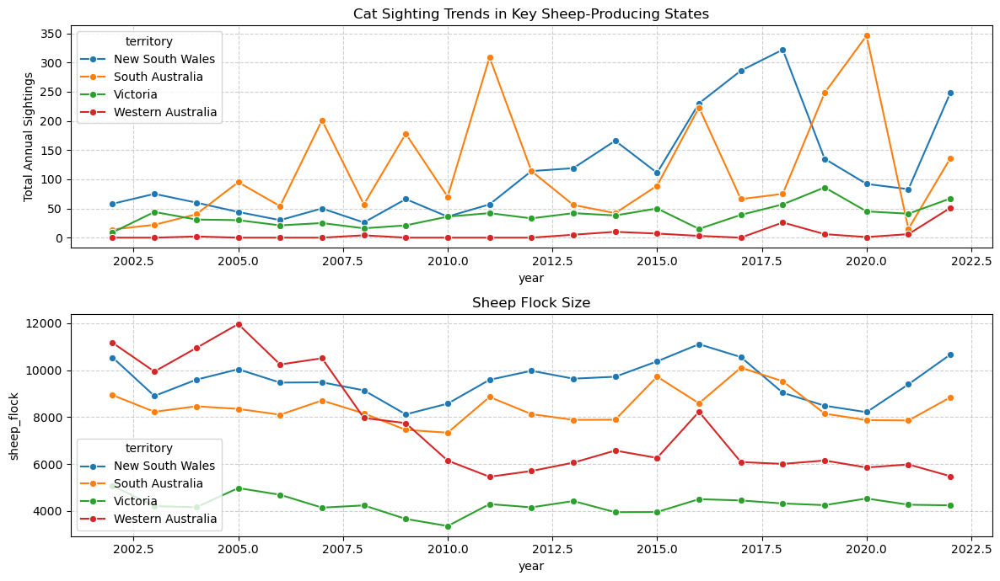

In [32]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
trend_df = sheep_df.groupby(['year', 'territory'])['cats_nonforest'].sum().reset_index()
trend_df2 = sheep_df.groupby(['year', 'territory'])['sheep_flock'].sum().reset_index()

sns.lineplot(data=trend_df, x='year', y='cats_nonforest', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=trend_df2, x='year', y='sheep_flock', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Sheep Flock Size')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

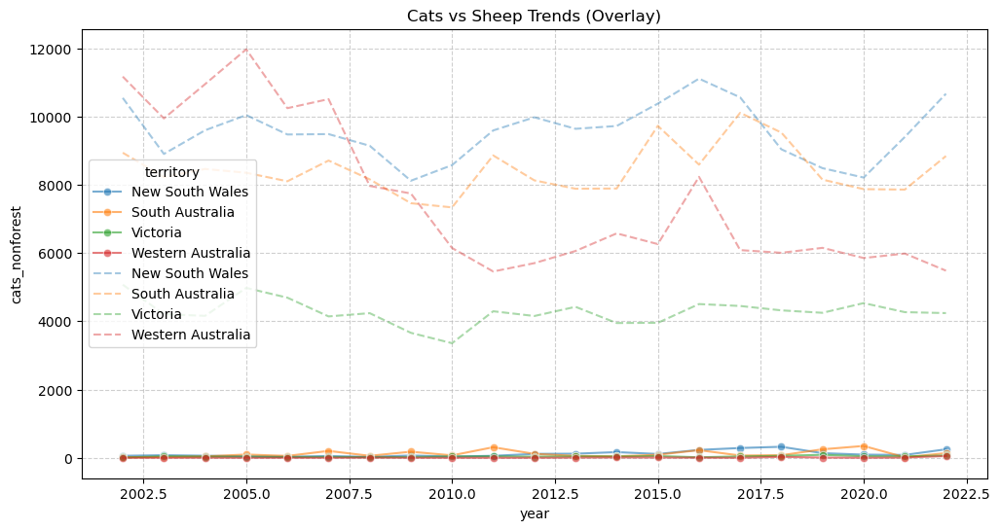

In [33]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=trend_df,
    x='year',
    y='cats_nonforest',
    hue='territory',
    marker='o',
    alpha=0.6
)

sns.lineplot(
    data=trend_df2,
    x='year',
    y='sheep_flock',
    hue='territory',
    linestyle='--',
    alpha=0.4
)

plt.title('Cats vs Sheep Trends (Overlay)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Normalize cat nonforest and sheep flock to compare trends

In [34]:
trend_df['cats_scaled'] = (
    trend_df.groupby('territory')['cats_nonforest']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

trend_df2['sheep_scaled'] = (
    trend_df2.groupby('territory')['sheep_flock']
    .transform(lambda x: (x - x.min()) / (x.max() - x.min()))
)

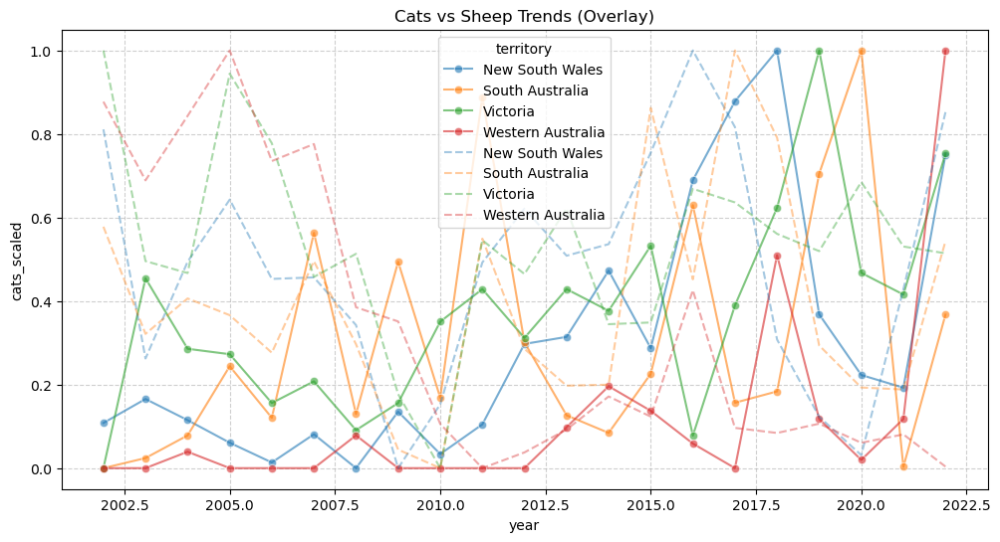

In [35]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=trend_df,
    x='year',
    y='cats_scaled',
    hue='territory',
    marker='o',
    alpha=0.6
)

sns.lineplot(
    data=trend_df2,
    x='year',
    y='sheep_scaled',
    hue='territory',
    linestyle='--',
    alpha=0.4
)

plt.title('Cats vs Sheep Trends (Overlay)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


## By Territory

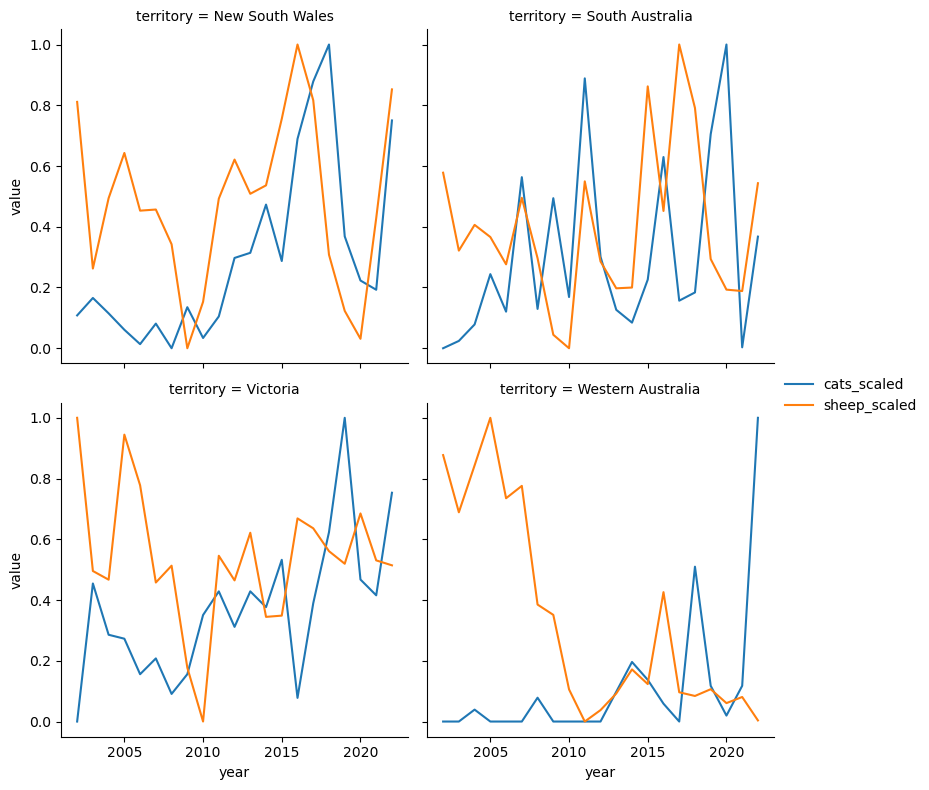

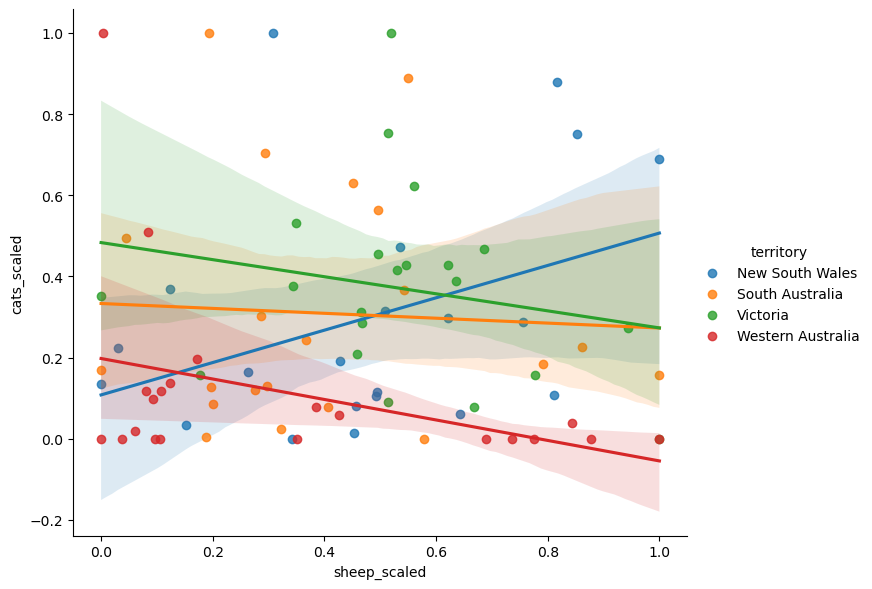

In [36]:
# Merge scaled datasets first
merged = trend_df[['year', 'territory', 'cats_scaled']].merge(
    trend_df2[['year', 'territory', 'sheep_scaled']],
    on=['year', 'territory']
)

# Melt to long format
plot_df = merged.melt(
    id_vars=['year', 'territory'],
    value_vars=['cats_scaled', 'sheep_scaled'],
    var_name='variable',
    value_name='value'
)

g = sns.FacetGrid(plot_df, col='territory', col_wrap=2, height=4, sharey=True)
g.map_dataframe(sns.lineplot, x='year', y='value', hue='variable')
g.add_legend()


sns.lmplot(
    data=merged,
    x='sheep_scaled',
    y='cats_scaled',
    hue='territory',
    height=6,
    aspect=1.2
)


## Full Analysis

In [37]:
merged = trend_df.merge(
    trend_df2,
    on=['year', 'territory']
)

correlations = merged.groupby('territory').apply(
    lambda x: x['cats_nonforest'].corr(x['sheep_flock'])
)

print(correlations)


territory
New South Wales      0.374041
South Australia     -0.053004
Victoria            -0.201146
Western Australia   -0.364594
dtype: float64


C:\Users\d\AppData\Local\Temp\ipykernel_18860\1227266040.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = merged.groupby('territory').apply(


In [38]:
for state in merged['territory'].unique():
    state_df = merged[merged['territory'] == state]

    X = sm.add_constant(state_df['sheep_flock'])
    y = state_df['cats_nonforest']

    model = sm.OLS(y, X).fit()
    print(f"\n{state}")
    print(model.summary())
# if p value less than 0.05 signif


New South Wales
                            OLS Regression Results                            
Dep. Variable:         cats_nonforest   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     3.091
Date:                Mon, 23 Feb 2026   Prob (F-statistic):             0.0948
Time:                        14:08:32   Log-Likelihood:                -121.52
No. Observations:                  21   AIC:                             247.0
Df Residuals:                      19   BIC:                             249.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        -262.4719    215.287

In [39]:
merged['cats_diff'] = merged.groupby('territory')['cats_nonforest'].diff()
merged['sheep_diff'] = merged.groupby('territory')['sheep_flock'].diff()

merged.groupby('territory').apply(
    lambda x: x['cats_diff'].corr(x['sheep_diff']), include_groups=False
)


territory
New South Wales      0.213885
South Australia      0.070748
Victoria            -0.361068
Western Australia   -0.059610
dtype: float64

# Economic Impact

### cat cost and occurrence Correlation Matrix

In [40]:
eco_corr = fce[['eco_cost_cat_only', 'cats_occurrence_total']].corr()
eco_corr.style.background_gradient(cmap='OrRd')

,eco_cost_cat_only,cats_occurrence_total
eco_cost_cat_only,1.000000,0.406506
cats_occurrence_total,0.406506,1.000000


### Cat Occurence v Cat Cost

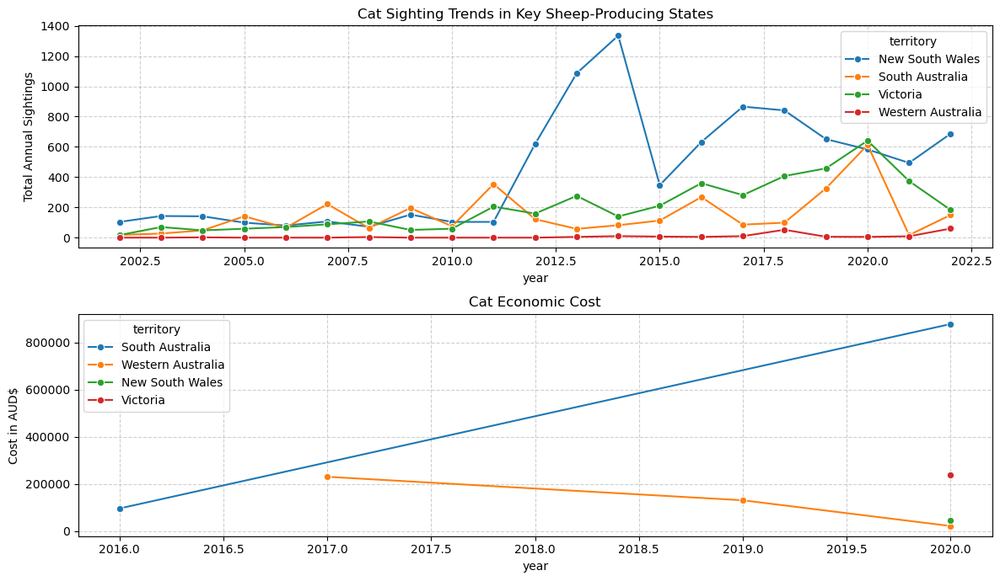

In [84]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
# Sheep regions only and sum occurrences by year
trend_df = sheep_df.groupby(['year', 'territory'])['cats_occurrence_total'].sum().reset_index()
trend_df2 = fce[
    (fce['territory'].isin(sheep_states)) &
    (fce['eco_cost_total'].notna())
][['year', 'territory', 'eco_cost_total']]

sns.lineplot(data=trend_df, x='year', y='cats_occurrence_total', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=trend_df2, x='year', y='eco_cost_total', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Cat Economic Cost')
ax[1].set_ylabel('Cost in AUD$')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

#### Pearson correlation

In [ ]:
from scipy.stats import pearsonr

merged = trend_df.merge(
    trend_df2,
    on=['year', 'territory']
)
# Pearson correlation
r, p = pearsonr(
    merged['cats_occurrence_total'],
    merged['eco_sector_agriculture']
)

print("Correlation:", r)
print("P-value:", p)

Correlation: 0.19467471009843465
P-value: 0.07597916212064869


### Graph with only All Australia

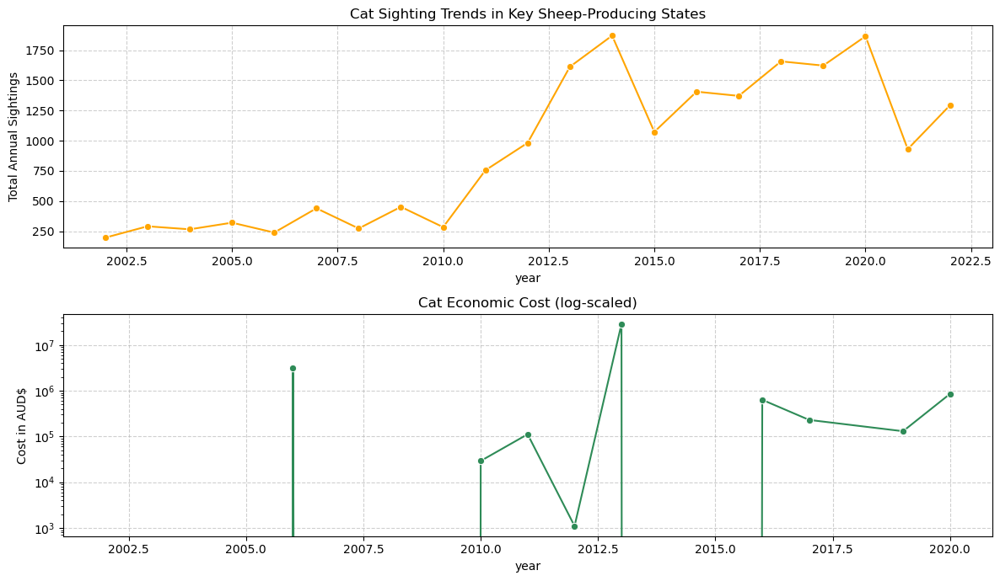

In [95]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
whole_country_fce = fce[fce['territory'] == 'All Australia'].groupby('year')['cats_occurrence_total'].sum().reset_index()
whole_country_fce2 = fce[
    (fce['territory'] == 'All Australia') &
    (fce['eco_type_eradication'].notna())
][['year', 'eco_type_eradication']]

sns.lineplot(data=whole_country_fce, x='year', y='cats_occurrence_total', color='orange', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=whole_country_fce2, x='year', y='eco_type_eradication', color='seagreen', marker='o', ax=ax[1])
ax[1].set_title('Cat Economic Cost (log-scaled)')
ax[1].set_yscale('log')
ax[1].set_ylabel('Cost in AUD$')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

In [65]:
sheep_df[
    sheep_df[['eco_cost_cat_only', 'eco_cost_total', 'eco_cost_total', 'eco_cost_cat_plus_other']].notna().all(axis=1)
][['year', 'territory']]

,year,territory
125,2016,South Australia
137,2017,Western Australia
153,2019,Western Australia
155,2020,New South Wales
158,2020,South Australia
161,2020,Victoria
162,2020,Western Australia


#### Pearson correlation

In [ ]:
merged = whole_country_fce.merge(
    whole_country_fce2,
    on=['year']
)
# Pearson correlation
r, p = pearsonr(
    merged['cats_occurrence_total'],
    merged['eco_cost_cat_only']
)

print("Correlation:", r) # Should be pos
print("P-value:", p) # Less than 0.05 for significance

Correlation: 0.3602776986600761
P-value: 0.10864384975241147


# Feral cat effect on sheep productivity
### (toxoplasmosis causes pregnancy complications)

### Lamb/Ewe Correlation Matrix (child/female)

In [45]:
lamb_corr = fce[['lambs', 'ewes']].corr()
lamb_corr.style.background_gradient(cmap='BuGn')

,lambs,ewes
lambs,1.000000,0.988165
ewes,0.988165,1.000000


### Lambing productivity compared to cat occurrence in areas

In [46]:
fce['fecundity'] = fce['lambs'] / fce['ewes'] # child/mother
fce['fecundity']

0      0.401719
1      0.437625
2           NaN
3      0.283068
4      0.399851
         ...   
174    0.517901
175    0.568750
176    0.551020
177    0.707746
178    0.590881
Name: fecundity, Length: 179, dtype: float64

In [47]:
sheep_df['fecundity'] = sheep_df['lambs'] / sheep_df['ewes']

## Lamb Graph

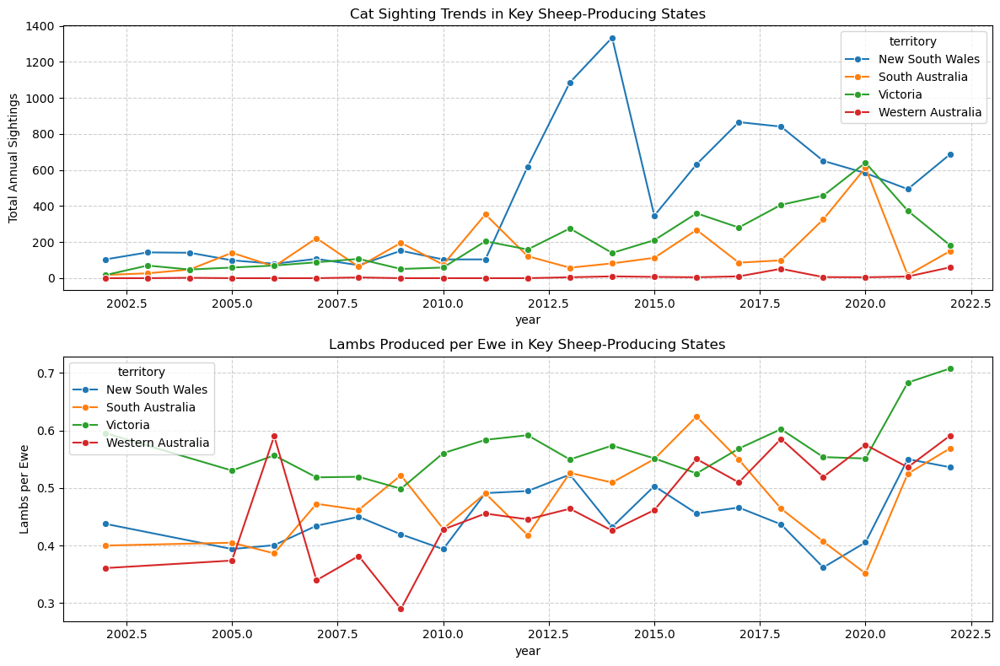

In [89]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
# Sheep regions only and sum occurrences by year
lamb_trend_df = sheep_df.groupby(['year', 'territory'])['cats_occurrence_total'].sum().reset_index()
lamb_trend_df2 = fce[
    (fce['territory'].isin(sheep_states)) &
    (fce['fecundity'].notna())
][['year', 'territory', 'fecundity']] # drop na values



sns.lineplot(data=lamb_trend_df, x='year', y='cats_occurrence_total', hue='territory', marker='o', ax=ax[0])
ax[0].set_title('Cat Sighting Trends in Key Sheep-Producing States')
ax[0].set_ylabel('Total Annual Sightings')
ax[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(data=lamb_trend_df2, x='year', y='fecundity', hue='territory', marker='o', ax=ax[1])
ax[1].set_title('Lambs Produced per Ewe in Key Sheep-Producing States')
ax[1].set_ylabel('Lambs per Ewe')
ax[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

#### Pearson Correlation

In [ ]:
# Pearson correlation
merged = lamb_trend_df.merge(
    lamb_trend_df2,
    on=['year', 'territory']
)
# Pearson correlation
r, p = pearsonr(
    merged['cats_occurrence_total'],
    merged['fecundity']
)

print("Correlation:", r)
print("P-value:", p)

Correlation: 0.009891734177974206
P-value: 0.9324148181710932


# Combined economic/sheep productivity analysis

In [91]:
cols = [
    'cats_forest',
    'cats_nonforest',
    'cats_occurrence_total',
    'eco_sector_agriculture',
    'eco_sector_authorities_stakeholders',
    'eco_type_damage_loss',
    'eco_type_eradication',
    'ewes',
    'lamb_sheep_shorn',
    'rams',
    'sheep_flock',
    'sheep_purchased'
]

corr_df = sheep_df[cols].copy()

In [92]:
corr_df = corr_df.dropna()

In [93]:
corr_matrix = corr_df.corr(method='pearson')
print(corr_matrix)

                                     cats_forest  cats_nonforest  \
cats_forest                             1.000000        0.150071   
cats_nonforest                          0.150071        1.000000   
cats_occurrence_total                   0.900108        0.565812   
eco_sector_agriculture                  0.325525        0.761961   
eco_sector_authorities_stakeholders    -0.334196       -0.335792   
eco_type_damage_loss                    0.325525        0.761961   
eco_type_eradication                   -0.501252       -0.483805   
ewes                                    0.051084        0.648074   
lamb_sheep_shorn                       -0.385143        0.742864   
rams                                   -0.301124        0.491148   
sheep_flock                            -0.106682        0.689496   
sheep_purchased                         0.788191        0.332699   

                                     cats_occurrence_total  \
cats_forest                                       0.9

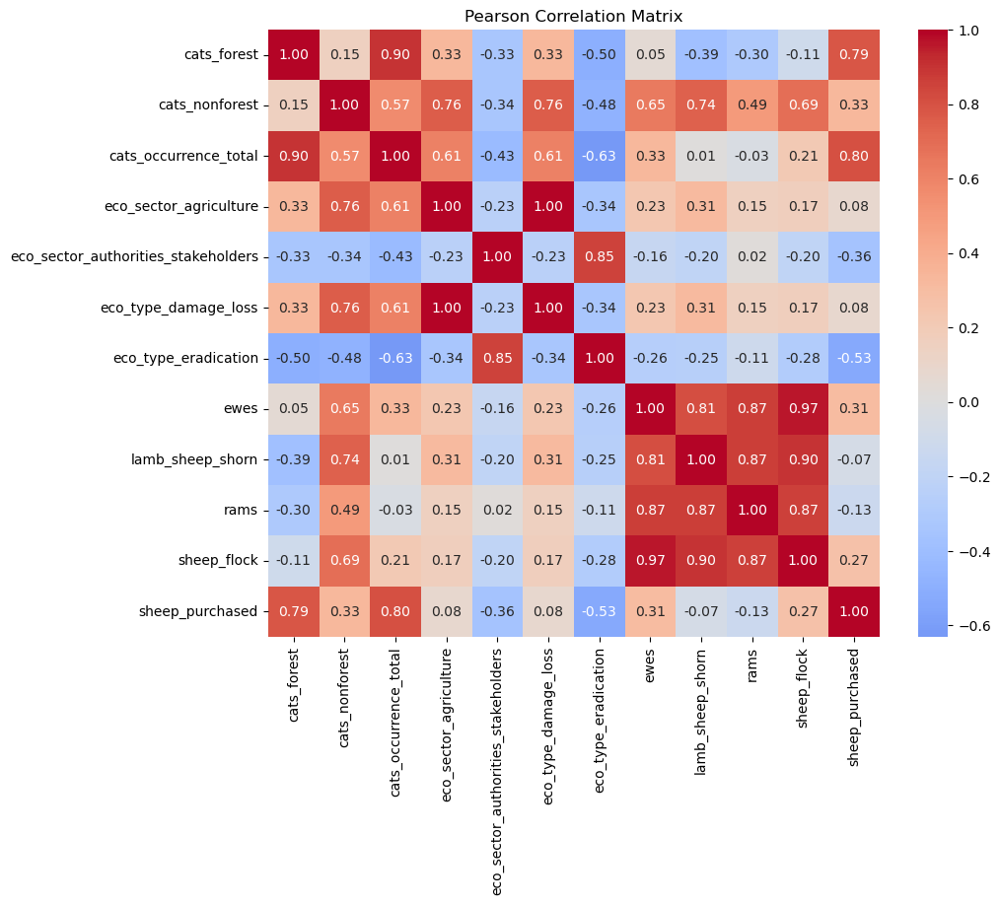

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Pearson Correlation Matrix")
plt.show()